In [11]:
!pip install opencv-python insightface onnxruntime ip-adapterv einops

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 845.5 kB/s eta 0:00:001m1.5 MB/s eta 0:00:01


In [16]:

import cv2
from insightface.app import FaceAnalysis
import torch

app = FaceAnalysis(name="buffalo_l", providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))


images = ["1.jpg", "2.jpg", "3.jpg", "4.jpg", "5.jpg"]

faceid_embeds = []
for img in images:
    image = cv2.imread(img)
    faces = app.get(image)
    faceid_embeds.append(torch.from_numpy(faces[0].normed_embedding).unsqueeze(0).unsqueeze(0))

faceid_embeds = torch.cat(faceid_embeds, dim=1)


/home/phil/work/mb/easybits/factory/.venv/lib/python3.11/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size

/home/phil/work/mb/easybits/factory/.venv/lib/python3.11/site-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


In [13]:
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler, AutoencoderKL
from PIL import Image

from ip_adapter.ip_adapter_faceid_separate import IPAdapterFaceID

base_model_path = "SG161222/Realistic_Vision_V4.0_noVAE"
vae_model_path = "stabilityai/sd-vae-ft-mse"
ip_ckpt = "ip-adapter-faceid-portrait_sd15.bin"
device = "cuda"

noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False,
    set_alpha_to_one=False,
    steps_offset=1,
)
vae = AutoencoderKL.from_pretrained(vae_model_path).to(dtype=torch.float16)
pipe = StableDiffusionPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    scheduler=noise_scheduler,
    vae=vae,
    feature_extractor=None,
    safety_checker=None
)


# load ip-adapter
ip_model = IPAdapterFaceID(pipe, ip_ckpt, device, num_tokens=16, n_cond=5)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [32]:
# generate image
prompt = "professional photoshoot full body portrait of a nude woman laying on the beach"
negative_prompt = "monochrome, lowres, bad anatomy, worst quality, low quality, blurry"

images = ip_model.generate(
    prompt=prompt,
    negative_prompt=negative_prompt,
    faceid_embeds=faceid_embeds,
    num_samples=4,
    width=512,
    height=512,
    num_inference_steps=30,
    seed=2023
)

  0%|          | 0/30 [00:00<?, ?it/s]

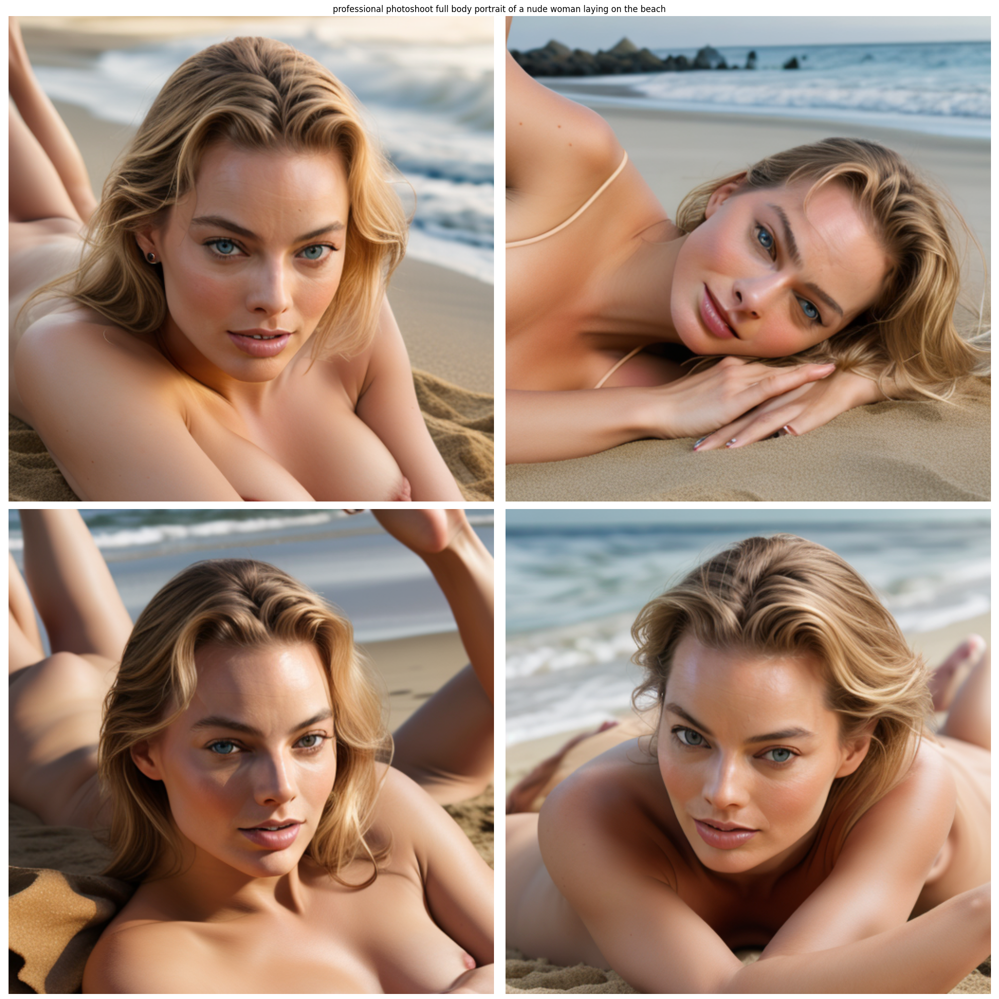

In [33]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 20))
plt.title(prompt)
plt.axis('off')
for i in range(4):
    ax = plt.subplot(2, 2, i+1)
    ax.imshow(images[i])
    plt.axis('off')

plt.tight_layout()
plt.savefig(prompt.lower().replace(' ', '_') + '.png')
plt.show()

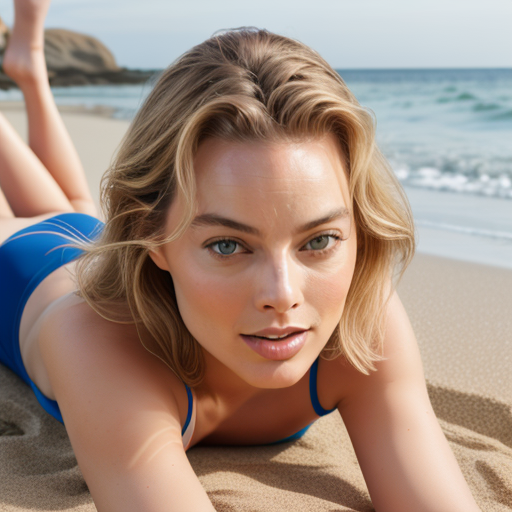

In [22]:
"full body portrait of a woman laying on the beach"
images[0]

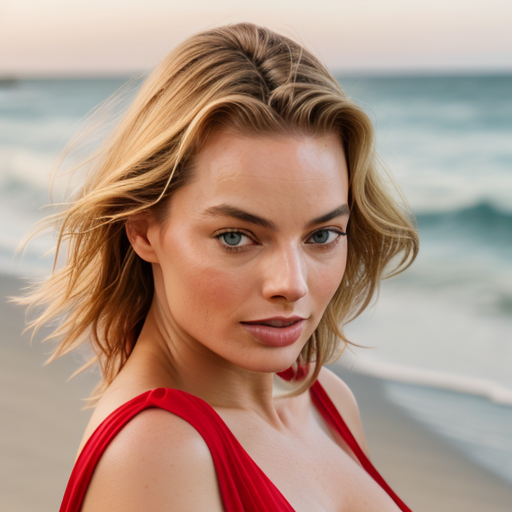

In [20]:
"photo of a woman in red dress on the beach"
images[0]

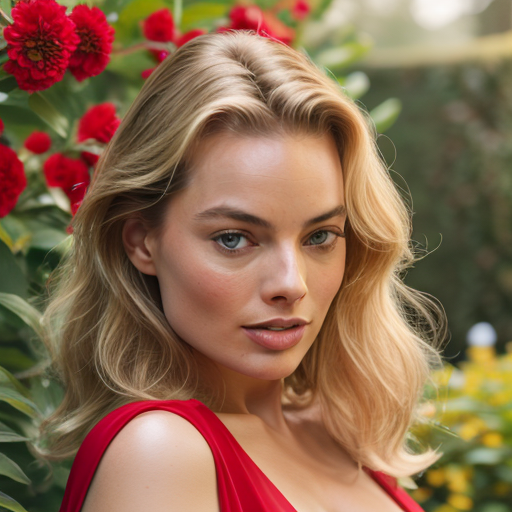

In [18]:
"photo of a woman in red dress in a garden"
images[0]

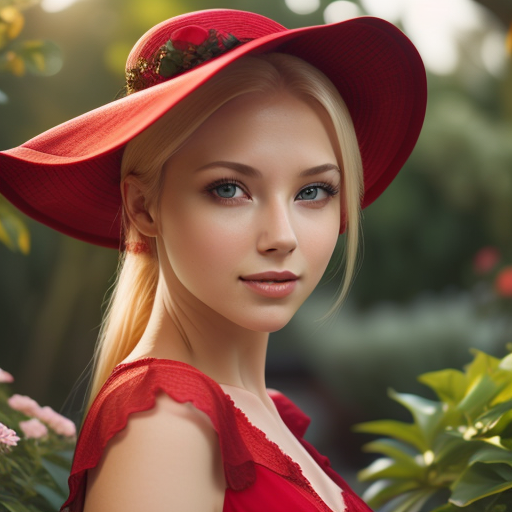

In [15]:
images[0]

In [1]:

import cv2
from insightface.app import FaceAnalysis
from insightface.utils import face_align
import torch

app = FaceAnalysis(name="buffalo_l", providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))

image = cv2.imread("naughty-margot-robbie-black-and-white-v9b73f8175k56v8v.jpg")
faces = app.get(image)

faceid_embeds = torch.from_numpy(faces[0].normed_embedding).unsqueeze(0)
face_image = face_align.norm_crop(image, landmark=faces[0].kps, image_size=224) # you can also segment the face


/home/phil/work/mb/easybits/factory/.venv/lib/python3.11/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:69: UserWarning: Specified provider 'CUDAExecutionProvider' is not in available provider names.Available providers: 'AzureExecutionProvider, CPUExecutionProvider'
  warnings.warn(


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/phil/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size

/home/phil/work/mb/easybits/factory/.venv/lib/python3.11/site-packages/insightface/utils/transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


In [2]:

import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler, AutoencoderKL
from PIL import Image

from ip_adapter.ip_adapter_faceid import IPAdapterFaceIDPlus

v2 = False
base_model_path = "SG161222/Realistic_Vision_V4.0_noVAE"
vae_model_path = "stabilityai/sd-vae-ft-mse"
image_encoder_path = "laion/CLIP-ViT-H-14-laion2B-s32B-b79K"
ip_ckpt = "ip-adapter-faceid-plus_sd15.bin" if not v2 else "ip-adapter-faceid-plusv2_sd15.bin"
device = "cuda"

noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False,
    set_alpha_to_one=False,
    steps_offset=1,
)
vae = AutoencoderKL.from_pretrained(vae_model_path).to(dtype=torch.float16)
pipe = StableDiffusionPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    scheduler=noise_scheduler,
    vae=vae,
    feature_extractor=None,
    safety_checker=None
)

# load ip-adapter
ip_model = IPAdapterFaceIDPlus(pipe, image_encoder_path, ip_ckpt, device)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

/home/phil/work/mb/easybits/factory/train/diffusers/src/diffusers/models/lora.py:208: FutureWarning: `LoRALinearLayer` is deprecated and will be removed in version 1.0.0. Use of `LoRALinearLayer` is deprecated. Please switch to PEFT backend by installing PEFT: `pip install peft`.
  deprecate("LoRALinearLayer", "1.0.0", deprecation_message)


In [6]:

# generate image
prompt = "professional photo of a naked woman laying on the beach"
negative_prompt = "monochrome, lowres, bad anatomy, worst quality, low quality, blurry"

images = ip_model.generate(
    prompt=prompt,
    negative_prompt=negative_prompt,
    face_image=face_image,
    faceid_embeds=faceid_embeds,
    shortcut=v2,
    s_scale=1.0,
    num_samples=4,
    width=512,
    height=768,
    num_inference_steps=35,
    seed=2024
)


  0%|          | 0/35 [00:00<?, ?it/s]

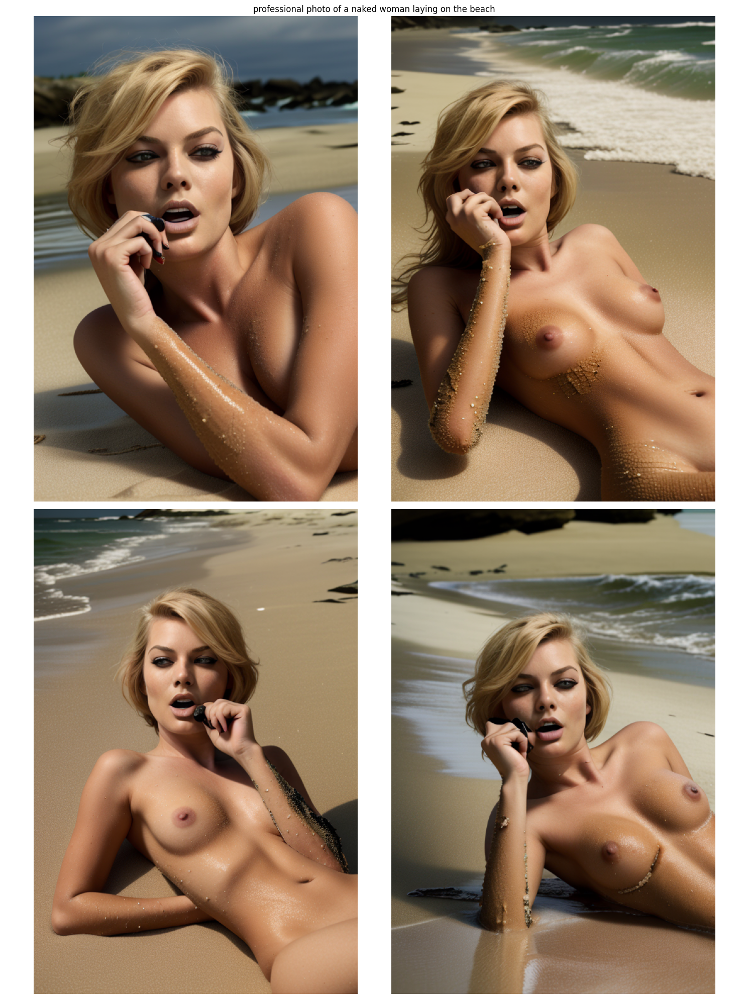

In [7]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15, 20))
plt.title(prompt)
plt.axis('off')
for i in range(4):
    ax = plt.subplot(2, 2, i+1)
    ax.imshow(images[i])
    plt.axis('off')

plt.tight_layout()
plt.savefig(prompt.lower().replace(' ', '_') + '.png')
plt.show()

In [32]:
images[1].save('troll.png')

In [3]:
import requests
import base64

In [109]:
with open("3.jpg", "rb") as image_file:
    encoded_string = base64.b64encode(image_file.read())

In [112]:
res = requests.post('http://localhost:8889/ip/', json={
    'task': {
        'ip': encoded_string.decode('ascii'),
        'prompt': 'wide shot of a young woman laying naked on the beach, highest quality, professional photo shoot, 8k, HDR',
        'options': {
            'num_inference_steps': 35,
            'guidance_scale': 7.5,
            'seed': 420,
            'negative_prompt': 'monochrome, lowres, bad anatomy, worst quality, low quality, blurry',
            's_scale': 0.05
        }
    }
})

In [113]:
with open('foo.png', 'wb') as f:
    f.write(base64.decodebytes(res.json()['image'].encode('ascii')))

In [90]:
res.json()

{'error': '"LayerNormKernelImpl" not implemented for \'Half\''}

In [ ]:
from diffusers import DiffusionPipeline

pipeline = DiffusionPipeline.from_pretrained("segmind/SSD-1B")
pipeline.load_lora_weights("philipp-zettl/ssd-butters-lora")